In [1]:
# Imports
import warnings
warnings.filterwarnings('ignore')

# Libraries for general purpose
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Text cleaning
import re
import string
import demoji
import nltk
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.corpus import stopwords

# Data preprocessing
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler
from langdetect import detect, LangDetectException
import contractions
from nltk.tokenize import word_tokenize

# ML Models
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV

# PyTorch LSTM
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

# Tokenization for LSTM
from collections import Counter
from numpy import triu
from gensim.models import Word2Vec

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from wordcloud import WordCloud
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import iplot

import cufflinks

import random

In [2]:
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')

nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')

demoji.download_codes()

# Define stop words for text cleaning
stop_words = set(stopwords.words('english') + ['rt', 'mkr', 'didn', 'bc', 'n', 'm', 'im', 'll', 'y', 've', 'u', 'ur', 'don', 't', 's', 'https', 'http', 'co'])

# Initialize lemmatizer for text cleaning
lemmatizer = WordNetLemmatizer()

# Set seed for reproducibility
seed_value = 2042
random.seed(seed_value)
np.random.seed(seed_value)
torch.manual_seed(seed_value)
torch.cuda.manual_seed_all(seed_value)

[nltk_data] Downloading package wordnet to /home/stinger/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/stinger/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/stinger/nltk_data...


[nltk_data]   Package punkt is already up-to-date!


... OK (Got response in 0.44 seconds)
Writing emoji data to /home/stinger/.demoji/codes.json ...
... OK


In [3]:
df_origin = pd.read_csv("./data/cyberbullying_tweets.csv")

In [4]:
df_origin

,tweet_text,cyberbullying_type
0,"In other words #katandandre, your food was cra...",not_cyberbullying
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying
...,...,...
47687,"Black ppl aren't expected to do anything, depe...",ethnicity
47688,Turner did not withhold his disappointment. Tu...,ethnicity
47689,I swear to God. This dumb nigger bitch. I have...,ethnicity
47690,Yea fuck you RT @therealexel: IF YOURE A NIGGE...,ethnicity


In [5]:
df_origin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47692 entries, 0 to 47691
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          47692 non-null  object
 1   cyberbullying_type  47692 non-null  object
dtypes: object(2)
memory usage: 745.3+ KB


In [6]:
df_origin.duplicated().sum()

36

In [7]:
df_origin.cyberbullying_type.value_counts()

religion               7998
age                    7992
gender                 7973
ethnicity              7961
not_cyberbullying      7945
other_cyberbullying    7823
Name: cyberbullying_type, dtype: int64

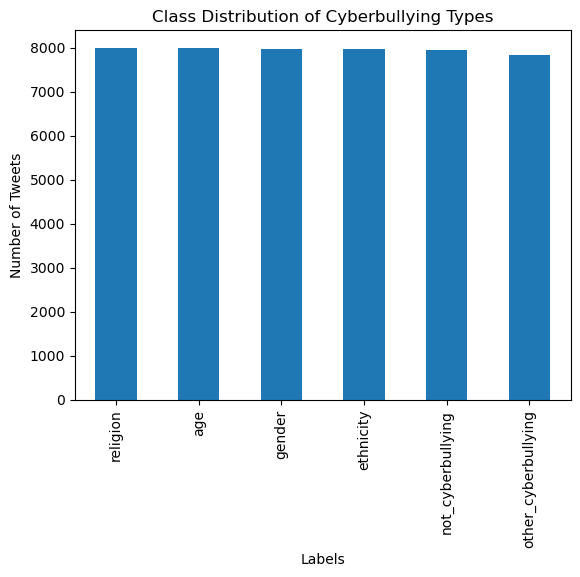

In [8]:
# Create a bar plot of the class distribution
class_counts = df_origin['cyberbullying_type'].value_counts()
class_counts.plot(kind='bar')
plt.title('Class Distribution of Cyberbullying Types')
plt.xlabel('Labels')
plt.ylabel('Number of Tweets')
plt.show()

In [9]:
df_origin.isna().any()

tweet_text            False
cyberbullying_type    False
dtype: bool

In [10]:
df = df_origin.copy()

In [11]:
df = df.rename(columns={'tweet_text': 'text', 'cyberbullying_type': 'sentiment'})

In [12]:
df = df[~df.duplicated()]

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47656 entries, 0 to 47691
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   text       47656 non-null  object
 1   sentiment  47656 non-null  object
dtypes: object(2)
memory usage: 1.1+ MB


In [14]:
# Clean emojis from text
def strip_emoji(text):
    return demoji.replace(text, '')

# Remove punctuations, stopwords, links, mentions and new line characters
def strip_all_entities(text):
    text = re.sub(r'\r|\n', ' ', text.lower())  # Replace newline and carriage return with space, and convert to lowercase
    text = re.sub(r"(?:\@|https?\://)\S+", "", text)  # Remove links and mentions
    text = re.sub(r'[^\x00-\x7f]', '', text)  # Remove non-ASCII characters
    banned_list = string.punctuation
    table = str.maketrans('', '', banned_list)
    text = text.translate(table)
    text = ' '.join(word for word in text.split() if word not in stop_words)
    return text

# Clean hashtags at the end of the sentence, and keep those in the middle of the sentence by removing just the # symbol
def clean_hashtags(tweet):
    # Remove hashtags at the end of the sentence
    new_tweet = re.sub(r'(\s+#[\w-]+)+\s*$', '', tweet).strip()
    
    # Remove the # symbol from hashtags in the middle of the sentence
    new_tweet = re.sub(r'#([\w-]+)', r'\1', new_tweet).strip()
    
    return new_tweet

# Filter special characters such as & and $ present in some words
def filter_chars(text):
    return ' '.join('' if ('$' in word) or ('&' in word) else word for word in text.split())

# Remove multiple spaces
def remove_mult_spaces(text):
    return re.sub(r"\s\s+", " ", text)

# Function to check if the text is in English, and return an empty string if it's not
def filter_non_english(text):
    try:
        lang = detect(text)
    except LangDetectException:
        lang = "unknown"
    return text if lang == "en" else ""

# Expand contractions
def expand_contractions(text):
    return contractions.fix(text)

# Remove numbers
def remove_numbers(text):
    return re.sub(r'\d+', '', text)

# Lemmatize words
def lemmatize(text):
    words = word_tokenize(text)
    lemmatized_words = [lemmatizer.lemmatize(word) for word in words]
    return ' '.join(lemmatized_words)

# Remove short words
def remove_short_words(text, min_len=2):
    words = text.split()
    long_words = [word for word in words if len(word) >= min_len]
    return ' '.join(long_words)

# Replace elongated words with their base form
def replace_elongated_words(text):
    regex_pattern = r'\b(\w+)((\w)\3{2,})(\w*)\b'
    return re.sub(regex_pattern, r'\1\3\4', text)

# Remove repeated punctuation
def remove_repeated_punctuation(text):
    return re.sub(r'[\?\.\!]+(?=[\?\.\!])', '', text)

# Remove extra whitespace
def remove_extra_whitespace(text):
    return ' '.join(text.split())

def remove_url_shorteners(text):
    return re.sub(r'(?:http[s]?://)?(?:www\.)?(?:bit\.ly|goo\.gl|t\.co|tinyurl\.com|tr\.im|is\.gd|cli\.gs|u\.nu|url\.ie|tiny\.cc|alturl\.com|ow\.ly|bit\.do|adoro\.to)\S+', '', text)

# Remove spaces at the beginning and end of the tweet
def remove_spaces_tweets(tweet):
    return tweet.strip()

# Remove short tweets
def remove_short_tweets(tweet, min_words=3):
    words = tweet.split()
    return tweet if len(words) >= min_words else ""

# Function to call all the cleaning functions in the correct order
def clean_tweet(tweet):
    tweet = strip_emoji(tweet)
    tweet = expand_contractions(tweet)
    tweet = filter_non_english(tweet)
    tweet = strip_all_entities(tweet)
    tweet = clean_hashtags(tweet)
    tweet = filter_chars(tweet)
    tweet = remove_mult_spaces(tweet)
    tweet = remove_numbers(tweet)
    tweet = lemmatize(tweet)
    tweet = remove_short_words(tweet)
    tweet = replace_elongated_words(tweet)
    tweet = remove_repeated_punctuation(tweet)
    tweet = remove_extra_whitespace(tweet)
    tweet = remove_url_shorteners(tweet)
    tweet = remove_spaces_tweets(tweet)
    tweet = remove_short_tweets(tweet)
    tweet = ' '.join(tweet.split())  # Remove multiple spaces between words
    return tweet

In [15]:
def get_top_n_gram(corpus,ngram_range,n=None):
    vec = CountVectorizer(ngram_range=ngram_range,stop_words = list(stop_words)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [16]:
df['text_clean'] = [clean_tweet(tweet) for tweet in df['text']]

In [17]:
df.head()

,text,sentiment,text_clean
0,"In other words #katandandre, your food was cra...",not_cyberbullying,word katandandre food crapilicious
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,aussietv white theblock imacelebrityau today s...
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,classy whore red velvet cupcake
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,meh thanks head concerned another angry dude t...
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,isi account pretending kurdish account like is...


In [18]:
print(f'There are {int(df["text_clean"].duplicated().sum())} duplicated tweets.')

There are 6555 duplicated tweets.


In [19]:
df.drop_duplicates("text_clean", inplace=True)

In [20]:
df.sentiment.value_counts()

religion               7913
age                    7816
ethnicity              7393
gender                 7199
not_cyberbullying      5948
other_cyberbullying    4832
Name: sentiment, dtype: int64

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41101 entries, 0 to 47691
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   text        41101 non-null  object
 1   sentiment   41101 non-null  object
 2   text_clean  41101 non-null  object
dtypes: object(3)
memory usage: 1.3+ MB


In [22]:
sentiments = ["religion","age","ethnicity","gender","not bullying", "other_cyberbullying"]

In [23]:
df['text_len'] = [len(text.split()) for text in df.text_clean]

In [24]:
fig = px.box(df,
             x = 'sentiment',
             y = 'text_len',
             color = 'sentiment',
             color_discrete_sequence = px.colors.diverging.curl,
             title = 'Boxplot of Tweet Lengths per class'
)


fig.update_yaxes(range = [0,80])
fig.show()


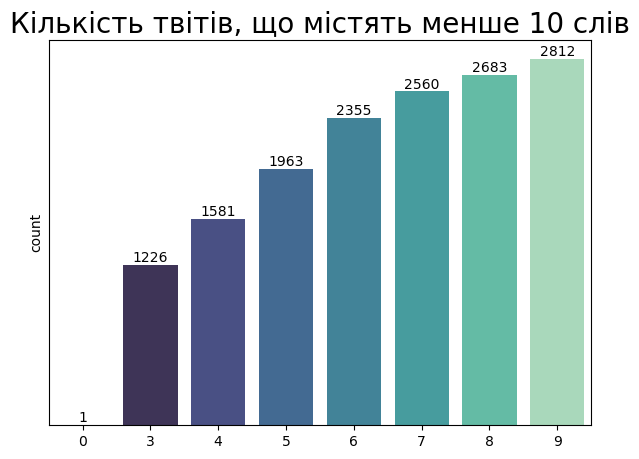

In [25]:
plt.figure(figsize=(7, 5))
ax = sns.countplot(x='text_len', data=df[df['text_len'] < 10], palette='mako')
plt.title('Кількість твітів, що містять менше 10 слів', fontsize=20)
plt.yticks([])
plt.ylabel('count')
plt.xlabel('')

# Add labels to each bar
for container in ax.containers:
    ax.bar_label(container)

plt.show()

In [26]:
df.sort_values(by=['text_len'], ascending=False)

,text,sentiment,text_clean,text_len
29205,is feminazi an actual word with a denot…\r\n@N...,other_cyberbullying,feminazi actual word denot job mean protecting...,359
24516,@NICKIMINAJ: #WutKinda\r\nAt this rate the MKR...,other_cyberbullying,wutkinda rate final december haha true never n...,326
30752,I don't retreat.\r\nyessssssss http://t.co/Td9...,other_cyberbullying,retreat yes uh make grownup boruto look lit ba...,231
44035,You so black and white trying to live like a n...,ethnicity,black white trying live like nigger pahahahaha...,172
45165,"@hermdiggz: “@tayyoung_: FUCK OBAMA, dumb ass ...",ethnicity,fuck obama dumb as nigger bitch ltthis whore s...,151
...,...,...,...,...
1477,@reddroostermann @No1_2Trust Their position no...,not_cyberbullying,position democratic confederalism,3
27026,Paul and Bex are bullying me.,other_cyberbullying,paul bex bullying,3
30275,This is what happens when you bully me... #kar...,other_cyberbullying,happens bully karma,3
31521,@Metroidthief are you getting into fights with...,other_cyberbullying,getting fight bot,3


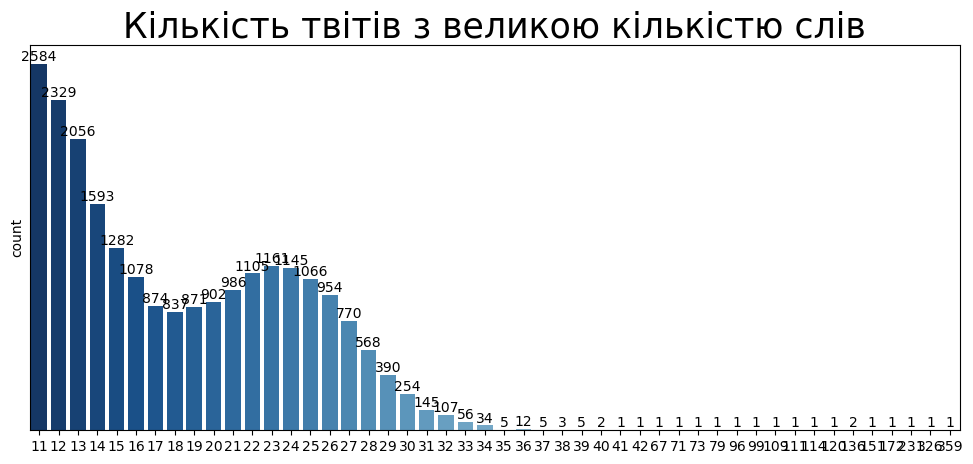

In [27]:
plt.figure(figsize=(12,5))
ax = sns.countplot(x='text_len', data=df[(df['text_len']<=1000) & (df['text_len']>10)], palette='Blues_r')
plt.title('Кількість твітів з великою кількістю слів', fontsize=25)
plt.yticks([])
plt.ylabel('count')
plt.xlabel('')

# Add labels to each bar
for container in ax.containers:
    ax.bar_label(container)

plt.show()

In [28]:
df = df[df['text_len'] < df['text_len'].quantile(0.995)]

In [29]:
fig = px.box(df,
             x = 'sentiment',
             y = 'text_len',
             color = 'sentiment',
             color_discrete_sequence = px.colors.diverging.curl,
             title = 'Boxplot of Tweet Lengths per class'
)


fig.update_yaxes(range = [0,35])
fig.show()

In [30]:
max_len = np.max(df['text_len'])
max_len 

31

In [31]:
df.sort_values(by=["text_len"], ascending=False)

,text,sentiment,text_clean,text_len
37237,Can't get beyond seeing & hearing Ian as a man...,age,can not get beyond seeing hearing ian manchild...,31
14770,My grandmother died of lung cancer while telli...,gender,grandmother died lung cancer telling joke trea...,31
46709,"(Acts 29:18468) AND (the satanic diabolical ""e...",ethnicity,act satanic diabolical enemy sowed white speci...,31
34374,Sure #MAGAts think that. In poor uneducated #M...,age,sure magats think poor uneducated maga househo...,31
36065,"Jazzruma must talk, Ella Sha made the biggest ...",age,jazzruma must talk ella sha made biggest mista...,31
...,...,...,...,...
5232,@Mesha_nojas: @_Vontethekidd &#128079;&#128079...,not_cyberbullying,got hick lol,3
30730,Watch http://t.co/8YC7xTDA2U to see @TheQuinns...,other_cyberbullying,watch see minute,3
30731,Waiting for outrage. You'll see.,other_cyberbullying,waiting outrage see,3
30854,ISIS: US 'being run by an idiot' https://t.co/...,other_cyberbullying,isi run idiot,3


In [32]:
# Viz: Lexical Uniqueness
def unique_word_share(text):
    words = text.split()
    word_count = len(words)
    unique_word_count = len(set([w.lower() for w in words]))
    word_uniqueness = round(unique_word_count * 100/word_count,2)
    return word_uniqueness

df['lexical_uniqueness'] = df['text'].apply(unique_word_share)

In [33]:
fig = px.box(df,
             y = 'sentiment',
             x = 'lexical_uniqueness',
             color = 'sentiment',
             color_discrete_sequence = px.colors.diverging.curl,
             title = 'Boxplot of Lexical Uniqueness per class'
)


fig.show()

In [34]:
def show_wordcloud(sentiment):
    plt.figure(figsize=(20,10))
    subset1 = df[df['sentiment']==sentiment]
    text = subset1.text.values
    cloud1=WordCloud(background_color='white',colormap="Dark2",collocations=False,width=2000,height=1000, max_font_size=300).generate(" ".join(text))
    
    plt.axis('off')
    plt.title(sentiment,fontsize=40)
    plt.imshow(cloud1)

def show_grams(sentiment):
    subset1 = df[df['sentiment']==sentiment]
    text = subset1.text.values
    unigrams = get_top_n_gram(text,(1,1),10)
    bigrams = get_top_n_gram(text,(2,2),10)
    
    gender_1 = pd.DataFrame(unigrams, columns = ['Text' , 'count'])
    gender_1.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
        kind='bar', yTitle='Count', linecolor='black',color='black', title='Top 10 Unigrams',orientation='h')
    
    gender_2 = pd.DataFrame(bigrams, columns = ['Text' , 'count'])
    gender_2.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
        kind='bar', yTitle='Count', linecolor='black',color='black', title='Top 10 Bigrams',orientation='h')

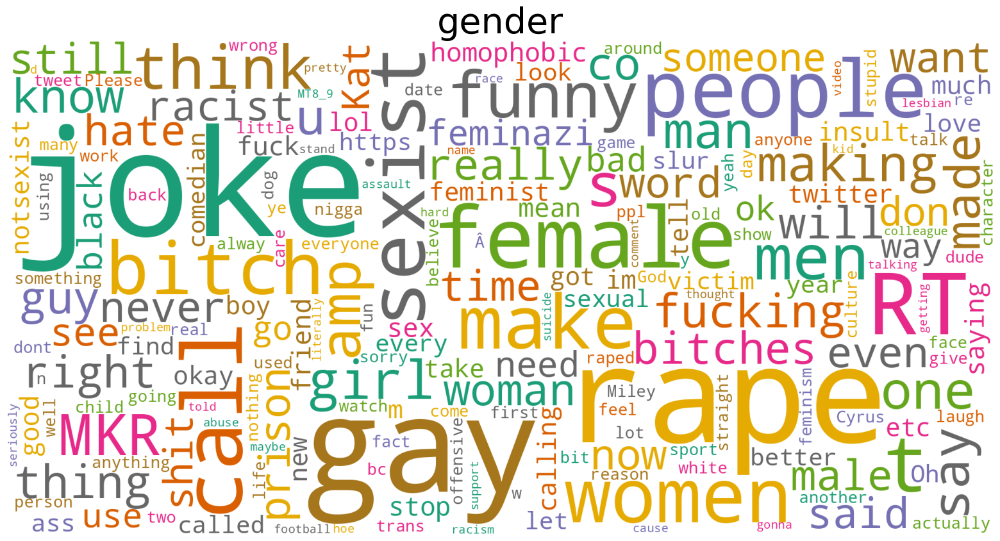

In [35]:
show_wordcloud('gender')
show_grams('gender')

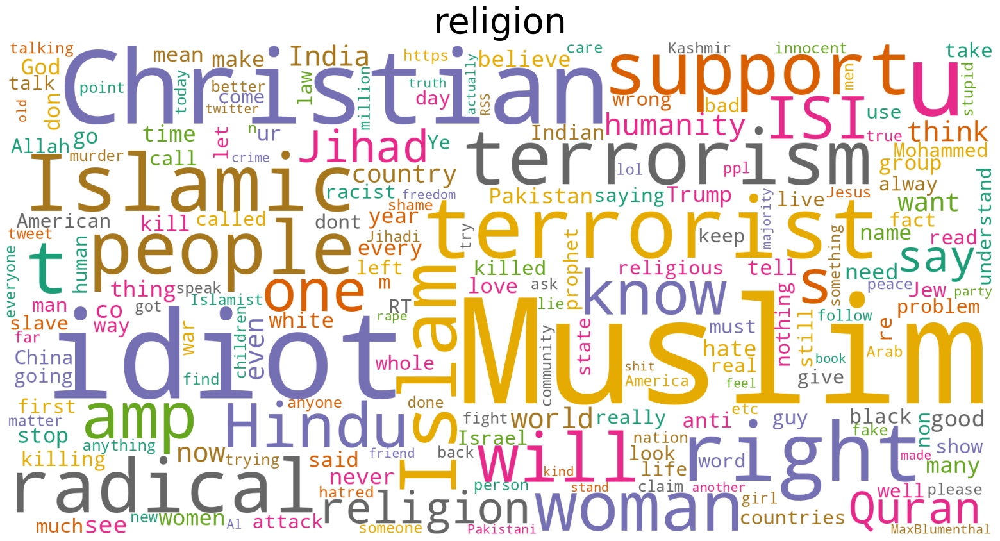

In [36]:
show_wordcloud('religion')
show_grams('religion')

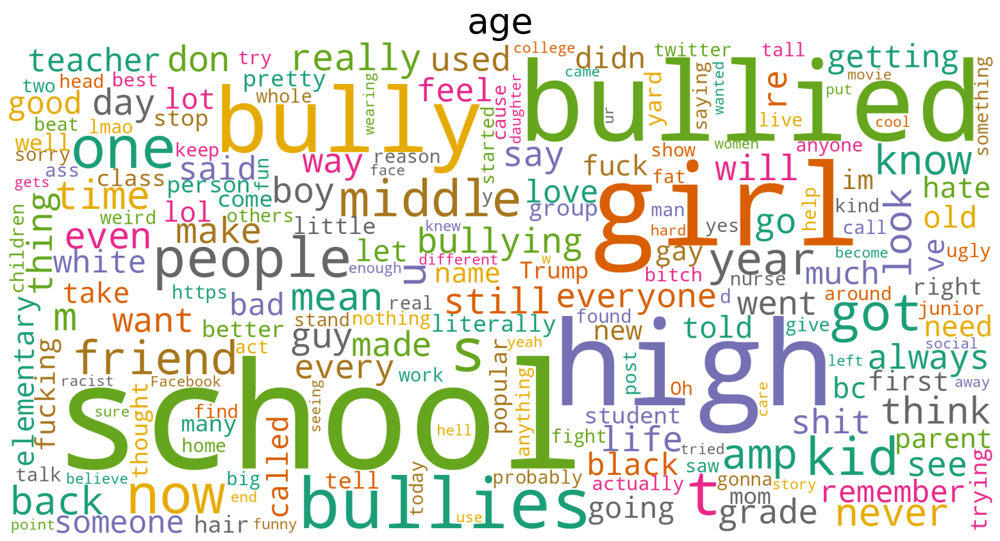

In [37]:
show_wordcloud('age')
show_grams('age')

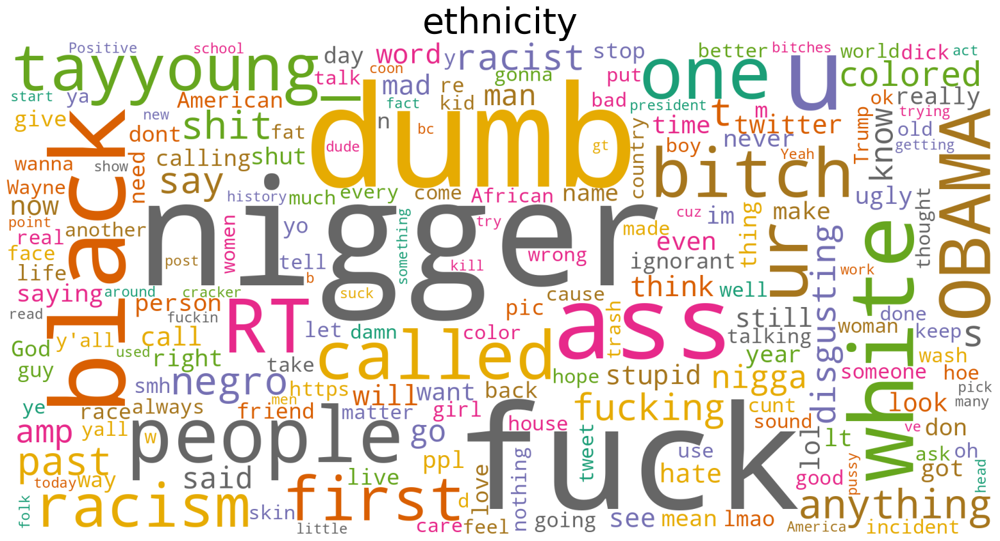

In [38]:
show_wordcloud('ethnicity')
show_grams('ethnicity')

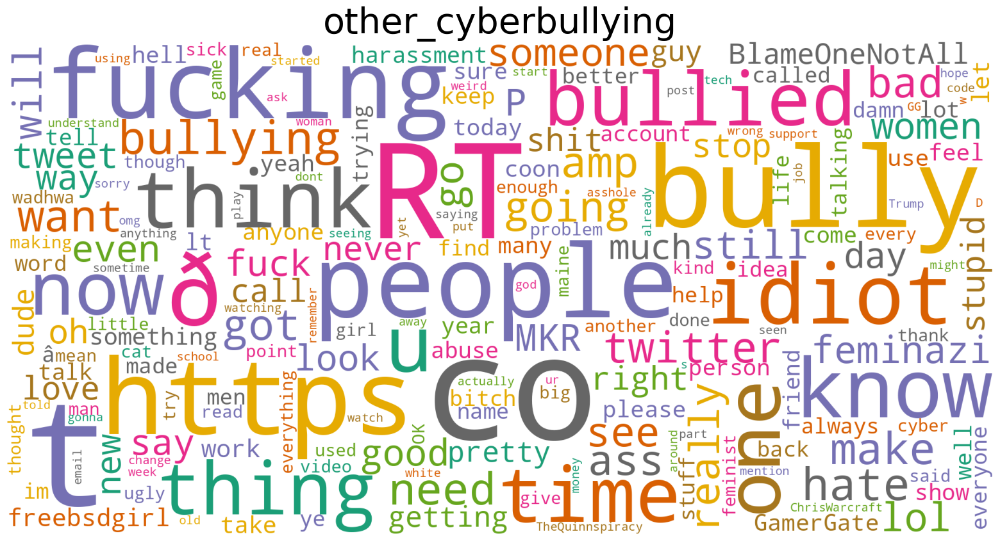

In [39]:
show_wordcloud('other_cyberbullying')
show_grams('other_cyberbullying')

In [40]:
df['sentiment'] = df['sentiment'].replace({'religion':0,'age':1,'ethnicity':2,'gender':3,'not_cyberbullying':4, 'other_cyberbullying':5})

In [41]:
df.head()

,text,sentiment,text_clean,text_len,lexical_uniqueness
0,"In other words #katandandre, your food was cra...",4,word katandandre food crapilicious,4,100.00
1,Why is #aussietv so white? #MKR #theblock #ImA...,4,aussietv white theblock imacelebrityau today s...,10,100.00
2,@XochitlSuckkks a classy whore? Or more red ve...,4,classy whore red velvet cupcake,5,100.00
3,"@Jason_Gio meh. :P thanks for the heads up, b...",4,meh thanks head concerned another angry dude t...,8,100.00
4,@RudhoeEnglish This is an ISIS account pretend...,4,isi account pretending kurdish account like is...,8,94.44


In [42]:
X = df['text_clean']
y = df['sentiment']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=seed_value)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, stratify=y_train, random_state=seed_value)

In [43]:
(unique, counts) = np.unique(y_train, return_counts=True)
np.asarray((unique, counts)).T

array([[   0, 5013],
       [   1, 4967],
       [   2, 4693],
       [   3, 4578],
       [   4, 3805],
       [   5, 3089]])

In [44]:
ros = RandomOverSampler()
X_train, y_train = ros.fit_resample(np.array(X_train).reshape(-1, 1), np.array(y_train).reshape(-1, 1));
train_os = pd.DataFrame(list(zip([x[0] for x in X_train], y_train)), columns = ['text_clean', 'sentiment']);

In [45]:
X_train = train_os['text_clean'].values
y_train = train_os['sentiment'].values

In [46]:
(unique, counts) = np.unique(y_train, return_counts=True)
np.asarray((unique, counts)).T

array([[   0, 5013],
       [   1, 5013],
       [   2, 5013],
       [   3, 5013],
       [   4, 5013],
       [   5, 5013]])

In [47]:
clf = CountVectorizer()
X_train_cv =  clf.fit_transform(X_train)
X_test_cv = clf.transform(X_test)

tf_transformer = TfidfTransformer(use_idf=True).fit(X_train_cv)
X_train_tf = tf_transformer.transform(X_train_cv)
X_test_tf = tf_transformer.transform(X_test_cv)

In [48]:
def conf_matrix(y, y_pred, title, labels):
    fig, ax =plt.subplots(figsize=(7.5,7.5))
    ax=sns.heatmap(confusion_matrix(y, y_pred), annot=True, cmap="Purples", fmt='g', cbar=False, annot_kws={"size":30})
    plt.title(title, fontsize=25)
    ax.xaxis.set_ticklabels(labels, fontsize=16) 
    ax.yaxis.set_ticklabels(labels, fontsize=14.5)
    ax.set_ylabel('Test', fontsize=25)
    ax.set_xlabel('Predicted', fontsize=25)
    plt.show()

In [49]:
conf_matrix = confusion_matrix(y_test, nb_pred)
disp = ConfusionMatrixDisplay(conf_matrix)
disp.plot()

NameError: name 'nb_pred' is not defined

In [ ]:
# Naive Bayes
nb_clf = MultinomialNB()
nb_clf.fit(X_train_tf, y_train)
nb_pred = nb_clf.predict(X_test_tf)
print('Classification Report for Naive Bayes:\n',classification_report(y_test, nb_pred, target_names=sentiments))

In [ ]:
# Logistic regression

reg_log = LogisticRegression(multi_class='multinomial')
reg_log.fit(X_train_tf, y_train)
reg_log_pred = reg_log.predict(X_test_tf)
print('Classification Report for Logistic regression:\n',classification_report(y_test, reg_log_pred, target_names=sentiments))

In [ ]:
# KNeighborsClassifier

kn_clf = KNeighborsClassifier()
kn_clf.fit(X_train_tf, y_train)
kn_clf_y_pred = kn_clf.predict(X_test_tf)
print('Classification Report for KNeighborsClassifier:\n',classification_report(y_test, reg_log_pred, target_names=sentiments))

In [ ]:
# SGDClassifier

sgd_clf = SGDClassifier()
sgd_clf.fit(X_train_tf, y_train)
sgd_clf_y_pred = sgd_clf.predict(X_test_tf)
print('Classification Report for SGDClassifier:\n',classification_report(y_test, sgd_clf_y_pred, target_names=sentiments))

In [ ]:
# DecisionTreeClassifier

dt_classifier = DecisionTreeClassifier()
dt_classifier.fit(X_train_tf, y_train)
dt_classifier_y_pred = dt_classifier.predict(X_test_tf)
print('Classification Report for DecisionTreeClassifier:\n',classification_report(y_test, dt_classifier_y_pred, target_names=sentiments))

In [ ]:
# RandomForestClassifier

rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train_tf, y_train)
rf_classifier_y_pred = rf_classifier.predict(X_test_tf)
print('Classification Report for RandomForestClassifier:\n',classification_report(y_test, rf_classifier_y_pred, target_names=sentiments))

In [49]:
# GradientBoostingClassifier

gb_classifier = GradientBoostingClassifier(random_state = seed_value, n_estimators = 200)
gb_classifier.fit(X_train_tf, y_train)
gb_classifier_y_pred = gb_classifier.predict(X_test_tf)
print('Classification Report for GradientBoostingClassifier:\n',classification_report(y_test, gb_classifier_y_pred, target_names=sentiments))

Classification Report for GradientBoostingClassifier:
                      precision    recall  f1-score   support

           religion       0.97      0.92      0.94      1567
                age       0.98      0.96      0.97      1553
          ethnicity       0.99      0.98      0.98      1467
             gender       0.94      0.85      0.89      1430
       not bullying       0.55      0.70      0.62      1189
other_cyberbullying       0.56      0.52      0.54       965

           accuracy                           0.85      8171
          macro avg       0.83      0.82      0.82      8171
       weighted avg       0.86      0.85      0.85      8171



In [50]:
model = gb_classifier

In [51]:
model.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'log_loss',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_iter_no_change': None,
 'random_state': 2042,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [148]:
%%time
# Create the random grid
param_grid = {'random_state': [seed_value],
              'n_estimators':[100, 200, 300],
             'max_depth': [3, 4, 5],
             'min_samples_split': [2, 4, 12]}

grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid, 
                    scoring='f1_micro', 
                    cv=2,
                    verbose = 3,
                    return_train_score=True,
                    n_jobs = -1)

grid.fit(X_train_tf, y_train)

print("The best parameters are %s with a score of %0.2f"
      % (grid.best_params_, grid.best_score_))

Fitting 2 folds for each of 3 candidates, totalling 6 fits
[CV 2/2] END n_estimators=200, random_state=2042;, score=(train=0.888, test=0.839) total time= 5.3min
[CV 2/2] END n_estimators=300, random_state=2042;, score=(train=0.912, test=0.849) total time= 7.4min
[CV 2/2] END n_estimators=100, random_state=2042;, score=(train=0.861, test=0.826) total time= 3.2min
[CV 1/2] END n_estimators=200, random_state=2042;, score=(train=0.907, test=0.835) total time= 4.6min
[CV 1/2] END n_estimators=300, random_state=2042;, score=(train=0.927, test=0.841) total time= 6.6min
[CV 1/2] END n_estimators=100, random_state=2042;, score=(train=0.869, test=0.822) total time= 2.9min


KeyboardInterrupt: 

In [50]:
# LSTM

def Tokenize(column, seq_len):
    ##Create vocabulary of words from column
    corpus = [word for text in column for word in text.split()]
    count_words = Counter(corpus)
    sorted_words = count_words.most_common()
    vocab_to_int = {w:i+1 for i, (w,c) in enumerate(sorted_words)}

    ##Tokenize the columns text using the vocabulary
    text_int = []
    for text in column:
        r = [vocab_to_int[word] for word in text.split()]
        text_int.append(r)
    ##Add padding to tokens
    features = np.zeros((len(text_int), seq_len), dtype = int)
    for i, review in enumerate(text_int):
        if len(review) <= seq_len:
            zeros = list(np.zeros(seq_len - len(review)))
            new = zeros + review
        else:
            new = review[: seq_len]
        features[i, :] = np.array(new)

    return sorted_words, features

In [51]:
vocabulary, tokenized_column = Tokenize(df["text_clean"], max_len)

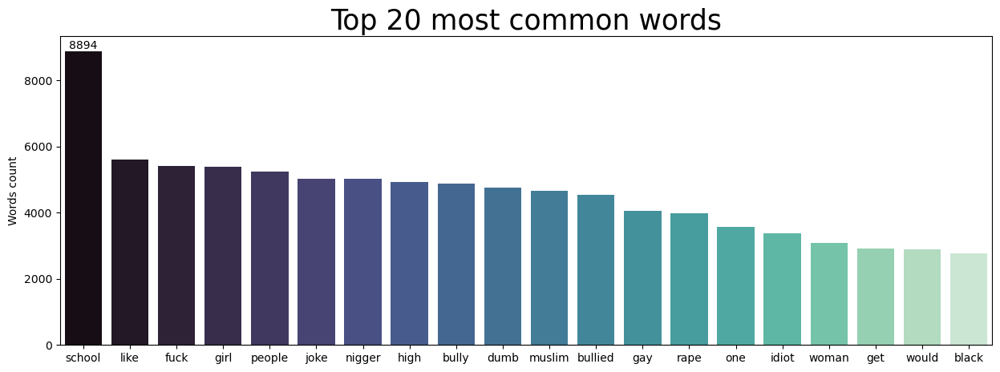

In [52]:
keys = []
values = []
for key, value in vocabulary[:20]:
    keys.append(key)
    values.append(value)


plt.figure(figsize=(15, 5))
ax = sns.barplot(x=keys, y=values, palette='mako')
plt.title('Top 20 most common words', size=25)
ax.bar_label(ax.containers[0])
plt.ylabel("Words count")
plt.show()

In [53]:
Word2vec_train_data = list(map(lambda x: x.split(), X_train))

In [54]:
EMBEDDING_DIM = 200

In [55]:
word2vec_model = Word2Vec(Word2vec_train_data, vector_size=EMBEDDING_DIM)

In [56]:
print(f"Vocabulary size: {len(vocabulary) + 1}")

Vocabulary size: 39725


In [57]:
VOCAB_SIZE = len(vocabulary) + 1 #+1 for the padding

In [58]:
# Define an empty embedding matrix of shape (VOCAB_SIZE, EMBEDDING_DIM)
embedding_matrix = np.zeros((VOCAB_SIZE, EMBEDDING_DIM))

# Fill the embedding matrix with pre-trained values from word2vec
for word, token in vocabulary:
    # Check if the word is present in the word2vec model's vocabulary
    if word in word2vec_model.wv.key_to_index:
        # If the word is present, retrieve its embedding vector and add it to the embedding matrix
        embedding_vector = word2vec_model.wv[word]
        embedding_matrix[token] = embedding_vector

# Print the shape of the embedding matrix
print("Embedding Matrix Shape:", embedding_matrix.shape)

Embedding Matrix Shape: (39725, 200)


In [59]:
X = tokenized_column
y = df['sentiment'].values

In [60]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=seed_value)

In [61]:
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, stratify=y_train, random_state=seed_value)

In [62]:
(unique, counts) = np.unique(y_train, return_counts=True)
np.asarray((unique, counts)).T

array([[   0, 5013],
       [   1, 4965],
       [   2, 4685],
       [   3, 4580],
       [   4, 3803],
       [   5, 3093]])

In [63]:
ros = RandomOverSampler()
X_train_os, y_train_os = ros.fit_resample(np.array(X_train),np.array(y_train));

In [64]:
(unique, counts) = np.unique(y_train_os, return_counts=True)
np.asarray((unique, counts)).T

array([[   0, 5013],
       [   1, 5013],
       [   2, 5013],
       [   3, 5013],
       [   4, 5013],
       [   5, 5013]])

In [65]:
train_data = TensorDataset(torch.from_numpy(X_train_os), torch.from_numpy(y_train_os))
test_data = TensorDataset(torch.from_numpy(X_test), torch.from_numpy(y_test))
valid_data = TensorDataset(torch.from_numpy(X_valid), torch.from_numpy(y_valid))

In [66]:
BATCH_SIZE = 32

In [67]:
train_loader = DataLoader(train_data, shuffle=True, batch_size=BATCH_SIZE, drop_last=True) 
valid_loader = DataLoader(valid_data, shuffle=False, batch_size=BATCH_SIZE, drop_last=True)
test_loader = DataLoader(test_data, shuffle=False, batch_size=BATCH_SIZE, drop_last=True)

In [68]:
class Attention(nn.Module):
    def __init__(self, hidden_dim, is_bidirectional):
        super(Attention, self).__init__()
        self.is_bidirectional = is_bidirectional
        # The attention linear layer which transforms the input data to the hidden space
        self.attn = nn.Linear(hidden_dim * (4 if is_bidirectional else 2), hidden_dim * (2 if is_bidirectional else 1))
        # The linear layer that calculates the attention scores
        self.v = nn.Linear(hidden_dim * (2 if is_bidirectional else 1), 1, bias=False)

    def forward(self, hidden, encoder_outputs):
        seq_len = encoder_outputs.size(1)
        # Concatenate the last two hidden states in case of a bidirectional LSTM
        if self.is_bidirectional:
            hidden = torch.cat((hidden[-2], hidden[-1]), dim=-1)
        else:
            hidden = hidden[-1]
        # Repeat the hidden state across the sequence length
        hidden_repeated = hidden.unsqueeze(1).repeat(1, seq_len, 1)
        # Calculate attention weights
        attn_weights = torch.tanh(self.attn(torch.cat((hidden_repeated, encoder_outputs), dim=2)))
        # Compute attention scores
        attn_weights = self.v(attn_weights).squeeze(2)
        # Apply softmax to get valid probabilities
        return nn.functional.softmax(attn_weights, dim=1)


class LSTM_Sentiment_Classifier(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, num_classes, lstm_layers, dropout, is_bidirectional):
        super(LSTM_Sentiment_Classifier, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = lstm_layers
        self.is_bidirectional = is_bidirectional

        # The Embedding layer that converts input words to embeddings
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        # LSTM layer which processes the embeddings
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, lstm_layers, batch_first=True, bidirectional=is_bidirectional)
        # Attention layer to compute the context vector
        self.attention = Attention(hidden_dim, is_bidirectional)
        # Fully connected layer which classifies the context vector into classes
        self.fc = nn.Linear(hidden_dim * (2 if is_bidirectional else 1), num_classes)
        # Apply LogSoftmax to outputs for numerical stability
        self.softmax = nn.LogSoftmax(dim=1)
        # Dropout layer for regularisation
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, hidden):
        # Transform words to embeddings
        embedded = self.embedding(x)
        # Pass embeddings to LSTM
        out, hidden = self.lstm(embedded, hidden)
        # Calculate attention weights
        attn_weights = self.attention(hidden[0], out)
        # Calculate context vector by taking the weighted sum of LSTM outputs
        context = attn_weights.unsqueeze(1).bmm(out).squeeze(1)
        # Classify the context vector
        out = self.softmax(self.fc(context))
        return out, hidden

    def init_hidden(self, batch_size):
        # Factor determines the size of hidden states depending on bidirectionality
        factor = 2 if self.is_bidirectional else 1
        # Initial hidden and cell states are zero
        h0 = torch.zeros(self.num_layers * factor, batch_size, self.hidden_dim).to(DEVICE)
        c0 = torch.zeros(self.num_layers * factor, batch_size, self.hidden_dim).to(DEVICE)

In [91]:
NUM_CLASSES = 6 #We are dealing with a multiclass classification of 5 classes
HIDDEN_DIM = 100 #number of neurons of the internal state (internal neural network in the LSTM)
LSTM_LAYERS = 1 #Number of stacked LSTM layers

IS_BIDIRECTIONAL = False # Set this to False for unidirectional LSTM, and True for bidirectional LSTM

LR = 4e-4 #Learning rate
DROPOUT = 0.5 #LSTM Dropout
EPOCHS = 10 #Number of training epoch

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

model = LSTM_Sentiment_Classifier(VOCAB_SIZE, EMBEDDING_DIM, HIDDEN_DIM, NUM_CLASSES, LSTM_LAYERS, DROPOUT, IS_BIDIRECTIONAL)

model = model.to(DEVICE)

# Initialize the embedding layer with the previously defined embedding matrix
model.embedding.weight.data.copy_(torch.from_numpy(embedding_matrix))
# Allow the embedding matrix to be fine-tuned to better adapt to our dataset and get higher accuracy
model.embedding.weight.requires_grad = True

# Set up the criterion (loss function)
criterion = nn.NLLLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay = 5e-6)

print(model)

LSTM_Sentiment_Classifier(
  (embedding): Embedding(39725, 200)
  (lstm): LSTM(200, 100, batch_first=True)
  (attention): Attention(
    (attn): Linear(in_features=200, out_features=100, bias=True)
    (v): Linear(in_features=100, out_features=1, bias=False)
  )
  (fc): Linear(in_features=100, out_features=6, bias=True)
  (softmax): LogSoftmax(dim=1)
  (dropout): Dropout(p=0.5, inplace=False)
)


In [92]:
total_step = len(train_loader)
total_step_val = len(valid_loader)

early_stopping_patience = 4
early_stopping_counter = 0

valid_acc_max = 0 # Initialize best accuracy top 0

for e in range(EPOCHS):

    #lists to host the train and validation losses of every batch for each epoch
    train_loss, valid_loss  = [], []
    #lists to host the train and validation accuracy of every batch for each epoch
    train_acc, valid_acc  = [], []

    #lists to host the train and validation predictions of every batch for each epoch
    y_train_list, y_val_list = [], []

    #initalize number of total and correctly classified texts during training and validation
    correct, correct_val = 0, 0
    total, total_val = 0, 0
    running_loss, running_loss_val = 0, 0


    ####TRAINING LOOP####

    model.train()

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE) #load features and targets in device

        h = model.init_hidden(labels.size(0))

        model.zero_grad() #reset gradients 

        output, h = model(inputs,h) #get output and hidden states from LSTM network
        
        loss = criterion(output, labels)
        loss.backward()
        
        running_loss += loss.item()
        
        optimizer.step()

        y_pred_train = torch.argmax(output, dim=1) #get tensor of predicted values on the training set
        y_train_list.extend(y_pred_train.squeeze().tolist()) #transform tensor to list and the values to the list
        
        correct += torch.sum(y_pred_train==labels).item() #count correctly classified texts per batch
        total += labels.size(0) #count total texts per batch

    train_loss.append(running_loss / total_step)
    train_acc.append(100 * correct / total)

    ####VALIDATION LOOP####
    
    with torch.no_grad():
        
        model.eval()
        
        for inputs, labels in valid_loader:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)

            val_h = model.init_hidden(labels.size(0))

            output, val_h = model(inputs, val_h)

            val_loss = criterion(output, labels)
            running_loss_val += val_loss.item()

            y_pred_val = torch.argmax(output, dim=1)
            y_val_list.extend(y_pred_val.squeeze().tolist())

            correct_val += torch.sum(y_pred_val==labels).item()
            total_val += labels.size(0)

        valid_loss.append(running_loss_val / total_step_val)
        valid_acc.append(100 * correct_val / total_val)

    #Save model if validation accuracy increases
    if np.mean(valid_acc) >= valid_acc_max:
        torch.save(model.state_dict(), './state_dict.pt')
        print(f'Epoch {e+1}:Validation accuracy increased ({valid_acc_max:.6f} --> {np.mean(valid_acc):.6f}).  Saving model ...')
        valid_acc_max = np.mean(valid_acc)
        early_stopping_counter=0 #reset counter if validation accuracy increases
    else:
        print(f'Epoch {e+1}:Validation accuracy did not increase')
        early_stopping_counter+=1 #increase counter if validation accuracy does not increase
        
    if early_stopping_counter > early_stopping_patience:
        print('Early stopped at epoch :', e+1)
        break
    
    print(f'\tTrain_loss : {np.mean(train_loss):.4f} Val_loss : {np.mean(valid_loss):.4f}')
    print(f'\tTrain_acc : {np.mean(train_acc):.3f}% Val_acc : {np.mean(valid_acc):.3f}%')

Epoch 1:Validation accuracy increased (0.000000 --> 79.442402).  Saving model ...
	Train_loss : 0.8262 Val_loss : 0.4513
	Train_acc : 64.247% Val_acc : 79.442%
Epoch 2:Validation accuracy increased (79.442402 --> 82.199755).  Saving model ...
	Train_loss : 0.3742 Val_loss : 0.4311
	Train_acc : 84.308% Val_acc : 82.200%
Epoch 3:Validation accuracy increased (82.199755 --> 83.180147).  Saving model ...
	Train_loss : 0.2126 Val_loss : 0.4638
	Train_acc : 92.435% Val_acc : 83.180%
Epoch 4:Validation accuracy did not increase
	Train_loss : 0.1246 Val_loss : 0.5516
	Train_acc : 95.777% Val_acc : 82.736%
Epoch 5:Validation accuracy did not increase
	Train_loss : 0.0785 Val_loss : 0.6679
	Train_acc : 97.454% Val_acc : 82.093%
Epoch 6:Validation accuracy did not increase
	Train_loss : 0.0570 Val_loss : 0.6921
	Train_acc : 98.229% Val_acc : 82.353%
Epoch 7:Validation accuracy did not increase
	Train_loss : 0.0416 Val_loss : 0.8188
	Train_acc : 98.795% Val_acc : 82.062%
Epoch 8:Validation accurac

In [93]:
def evaluate_model(model, test_loader):
    model.eval()
    y_pred_list = []
    y_test_list = []
    
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            test_h = model.init_hidden(labels.size(0))

            output, val_h = model(inputs, test_h)
            y_pred_test = torch.argmax(output, dim=1)
            y_pred_list.extend(y_pred_test.squeeze().tolist())
            y_test_list.extend(labels.squeeze().tolist())
    
    return y_pred_list, y_test_list

y_pred_list, y_test_list = evaluate_model(model, test_loader)

In [94]:
print('Classification Report for LSTM:\n',classification_report(y_test_list, y_pred_list, target_names=sentiments))

Classification Report for LSTM:
                      precision    recall  f1-score   support

           religion       0.92      0.94      0.93      1565
                age       0.93      0.97      0.95      1552
          ethnicity       0.96      0.95      0.96      1463
             gender       0.87      0.83      0.85      1430
       not bullying       0.54      0.53      0.54      1186
other_cyberbullying       0.50      0.51      0.50       964

           accuracy                           0.82      8160
          macro avg       0.79      0.79      0.79      8160
       weighted avg       0.82      0.82      0.82      8160

